# Questão 2

TODO: Inserir comentários gerais sobre os desempenhos dos algoritmos.
TODO: Inserir cabeçalho nos dois notebooks e detalhar que foi necessário separar o arquivo em dois notebooks.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from time import time
# Para garantia de reprodutibilidade.
np.random.seed(50)
def esfera(x, n=None):
    """
    f(x) = Σ(xi²) para i=1 até n
    
    Args:
        x: array de valores
        n: número de termos (se None, usa todo o array x)
    
    Returns:
        Soma dos quadrados dos n primeiros elementos de x
    """
    x = np.array(x) if not isinstance(x, np.ndarray) else x
    
    if n is None:
        n = len(x)
    else:
        n = min(n, len(x))
    
    return np.sum(x[:n]**2)

def ackley(x, n=None):
    """
    f(x) = -20*exp(-0.2*√(1/n * Σxi²)) - exp(1/n * Σcos(2πxi)) + 20 + e
    
    Args:
        x: array de valores
        n: número de termos (se None, usa todo o array x)
    
    Returns:
        Valor da função de Ackley
    """
    x = np.array(x) if not isinstance(x, np.ndarray) else x
    
    if n is None:
        n = len(x)
    else:
        n = min(n, len(x))
    
    # Primeiro termo: -20 * exp(-0.2 * sqrt(1/n * Σxi²))
    sum_squares = np.sum(x[:n]**2)
    term1 = -20 * np.exp(-0.2 * np.sqrt((1/n) * sum_squares))
    
    # Segundo termo: -exp(1/n * Σcos(2πxi))
    sum_cos = np.sum(np.cos(2 * np.pi * x[:n]))
    term2 = -np.exp((1/n) * sum_cos)
    
    # Resultado final: term1 + term2 + 20 + e
    return term1 + term2 + 20 + np.e

In [2]:
def plot_funcao(valores_iteracoes, valores_funcao, funcao = "esfera"):
    x_range = np.linspace(-3, 3, 250)
    y_range = np.linspace(-3, 3, 250)
    X, Y = np.meshgrid(x_range, y_range)
    Z = np.zeros_like(X)

    for i in range(X.shape[0]):
        for j in range(X.shape[1]):
            point = [X[i, j], Y[i, j]]
            match funcao:
                case "esfera":
                    Z[i, j] = esfera(point)
                case "ackley":
                    Z[i, j] = ackley(point)
    
    fig = plt.figure(figsize=(12, 8))
    #Limitar eixos x e y para o intervalo [-3, 3]

    ax = fig.add_subplot(111, projection="3d")
    plt.xlim(-3, 3)
    plt.ylim(-3, 3)
    ax.set_zlim(np.min(Z), np.max(Z))
    # Alterar a ordem de plotagem para que os pontos fiquem na frente da superfície
    ax.contour3D(
        X, Y, Z, 200, cmap="summer", alpha=0.3
    )  # Tornar a superfície semitransparente
    ax.set_title("Pontos por iteração")
    ax.set_xlabel("x1")
    ax.set_ylabel("x2")
    ax.set_zlabel("f(x1, x2)")
    ax.scatter3D(
        [p[0] for p in valores_iteracoes],
        [p[1] for p in valores_iteracoes],
        valores_funcao[1],
        color="blue",
        s=25,
    )

    # Destacar o ponto final em vermelho
    final_point = valores_iteracoes[-1]
    final_value = valores_funcao[-1]
    ax.scatter3D(
        final_point[0],
        final_point[1],
        final_value,
        color="red",
        s=80,
        label="Ponto final"
    )
    ax.legend()

In [3]:
#Implementar algoritmo genético para otimização de função.
#Retornar o melhor indivíduo e a média dos indivíduos da população por geração.

def genetic_algorithm(func, pop_size=50, generations=50, mutation_rate=0.1):
    
    """
    Algoritmo genético para otimização de uma função.
    
    Args:
        func: função a ser otimizada
        pop_size: tamanho da população
        generations: número de gerações
        mutation_rate: taxa de mutação
    
    Returns:
        Melhor indivíduo e média dos indivíduos por geração
    """
    # Inicialização da população
    #population = np.random.uniform(bounds[0][0], bounds[0][1], (pop_size, len(bounds)))
    population = np.random.uniform(-30, 30, (pop_size, 2))

    best_individuals = []
    avg_fitness = []
    best_values = []
    avg_values = []
    for generation in range(generations):
        fitness = np.array([func(ind) for ind in population])
        
        # Seleção dos melhores indivíduos
        best_indices = np.argsort(fitness)[:pop_size // 2]
        best_population = population[best_indices]
        
        # Crossover
        offspring = []
        for i in range(pop_size // 2):
            parent1, parent2 = best_population[np.random.choice(len(best_population), 2, replace=False)]
            crossover_point = np.random.randint(1, len((-30,30)))
            child = np.concatenate((parent1[:crossover_point], parent2[crossover_point:]))
            offspring.append(child)
        
        offspring = np.array(offspring)
        
        # Mutação
        mutation_mask = np.random.rand(*offspring.shape) < mutation_rate
        offspring += mutation_mask * np.random.uniform(-1, 1, offspring.shape)
        
        # Nova população
        population = np.vstack((best_population, offspring))
        
        # Armazenar o melhor indivíduo e a média da população
        best_individuals.append(population[np.argmin(fitness)])
        best_values.append(np.min(fitness))
        avg_fitness.append(np.mean(fitness))
        avg_values.append(np.mean([func(ind) for ind in population]))
    
    return best_individuals, best_values, avg_fitness, avg_values



### Teste da implementação.

In [4]:
pontos_ga_esfera = genetic_algorithm(esfera, pop_size=20, generations=50, mutation_rate=0.1)
pontos_ga_ackley = genetic_algorithm(ackley, pop_size=20, generations=50, mutation_rate=0.1)

#### Função Esfera

Print dos melhores indivíduos de cada geração.

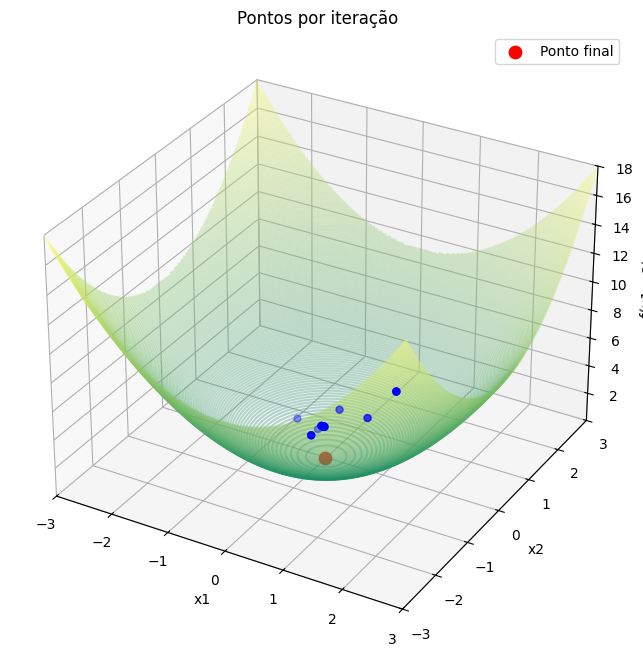

In [5]:
plot_funcao(pontos_ga_esfera[0], pontos_ga_esfera[1], funcao="esfera")

Print da média dos indivíduos de cada geração.

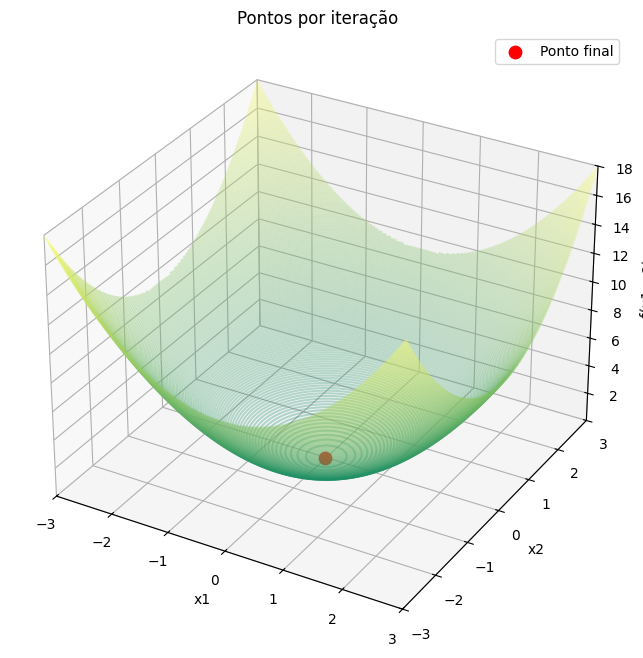

In [6]:
plot_funcao(pontos_ga_esfera[0], pontos_ga_esfera[3], funcao="esfera")

Obs: As médias dos indivíduos não aparecem no plot pois os valores estão fora do limite da restrição do eixo Z.

Ver o plot 2D abaixo.

<Axes: >

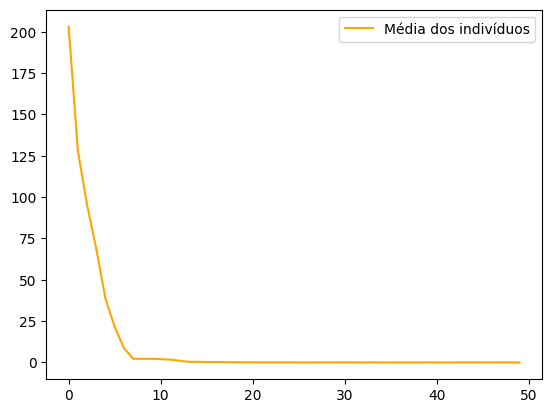

In [7]:
sns.lineplot(x = np.arange(0,len(pontos_ga_esfera[3])), y = pontos_ga_esfera[3], label="Média dos indivíduos", color="orange")

#### Função de Ackley

Print dos melhores indivíduos de cada geração.

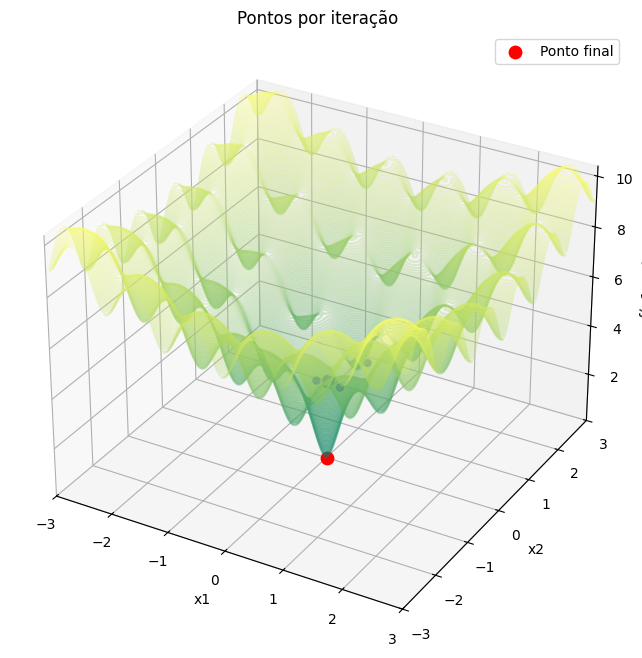

In [8]:
plot_funcao(pontos_ga_ackley[0], pontos_ga_ackley[1], funcao="ackley")

Print da média dos indivíduos de cada geração.

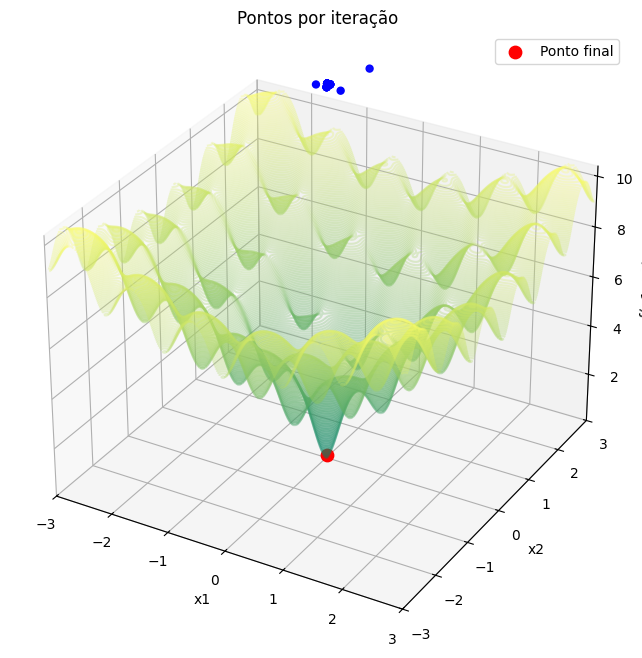

In [9]:
plot_funcao(pontos_ga_ackley[0], pontos_ga_ackley[3], funcao="ackley")

#### Comentário

O algoritmo genético atingiu o mínimo global das duas funções no caso de teste da implementação.

In [10]:
# Gerar iterações do algoritmo genético com valores aleatórios para os parâmetros (exceto pop_size)
def gerar_iteracoes_genetico(num_iteracoes=10):
    iteracoes = []
    for _ in range(num_iteracoes):
        mutation_rate = np.random.uniform(0.01, 0.3)
        generations = np.random.randint(10, 100)
        iteracoes.append((mutation_rate, generations))
    return iteracoes

# Obter valores do algoritmo genético para cada iteração, pop_size é argumento da função
def obter_valores_genetico(iteracoes, funcao=esfera, pop_size=20):
    resultados = []
    for mutation_rate, generations in iteracoes:
        # genetic_algorithm retorna 4 valores, vamos desempacotar corretamente
        valores = genetic_algorithm(
            funcao,
            pop_size=pop_size,
            mutation_rate=mutation_rate,
            generations=generations
        )
        resultados.append(valores)
    return resultados

def plot_resultados_ga(resultados, funcao="esfera"):
    for i, (best_individuals, best_values, avg_fitness, avg_values) in enumerate(resultados):
        plot_funcao(best_individuals, best_values, funcao)
        plt.title(f"GA Iteração {i+1}")
        plt.show()

In [11]:
iteracoes_ga = gerar_iteracoes_genetico(num_iteracoes=10)
resultados_ga_esfera_20 = obter_valores_genetico(iteracoes_ga, funcao=esfera, pop_size=20)
resultados_ga_ackley_20 = obter_valores_genetico(iteracoes_ga, funcao=ackley, pop_size=20)
time_inicio = time()
resultados_ga_esfera_50 = obter_valores_genetico(iteracoes_ga, funcao=esfera, pop_size=50)
resultados_ga_ackley_50 = obter_valores_genetico(iteracoes_ga, funcao=ackley, pop_size=50)
time_fim = time()
print(f"Tempo total de execução: {time_fim - time_inicio:.2f} segundos")

Tempo total de execução: 1.30 segundos


### a) População de 20 indivíduos.

#### Função Esfera

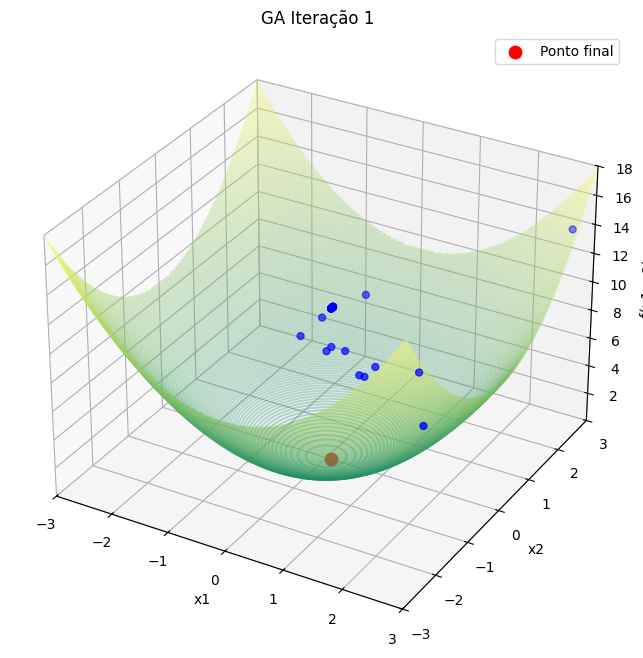

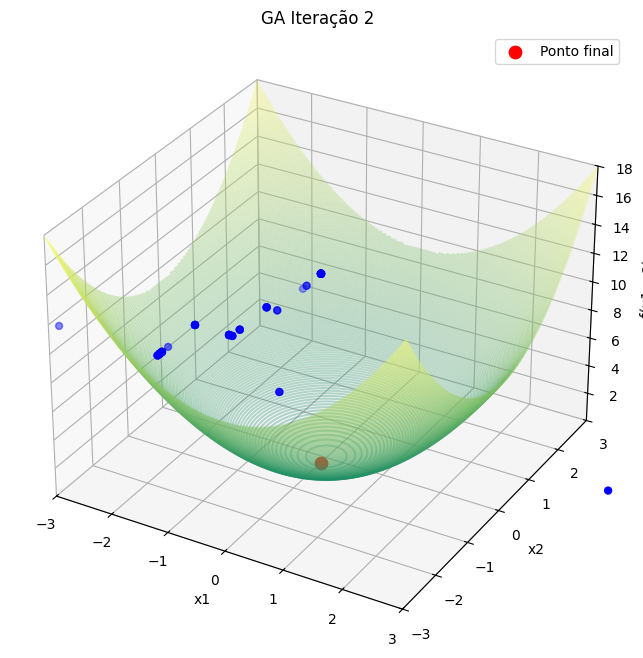

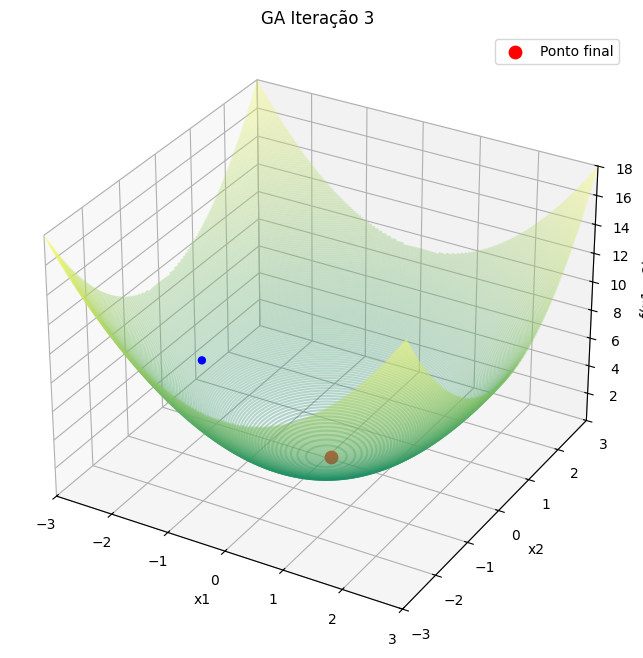

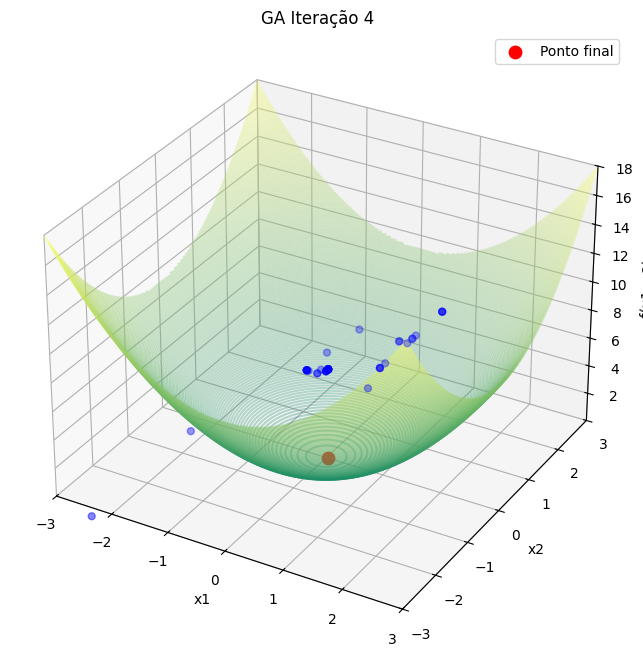

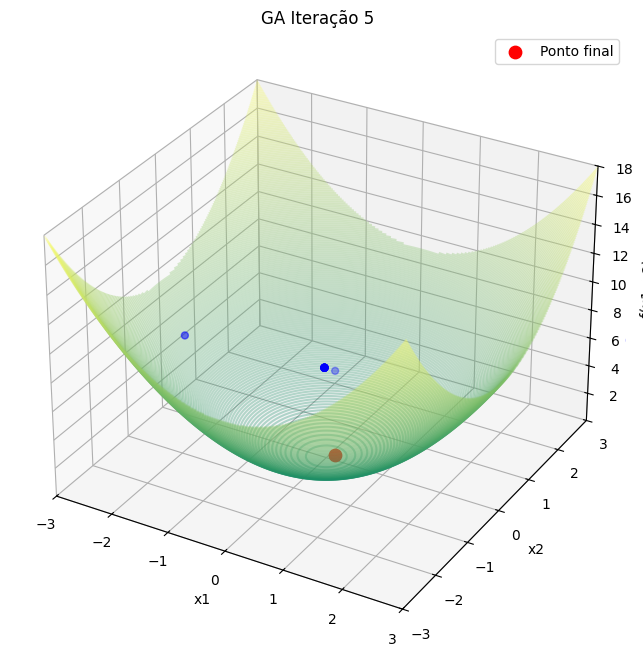

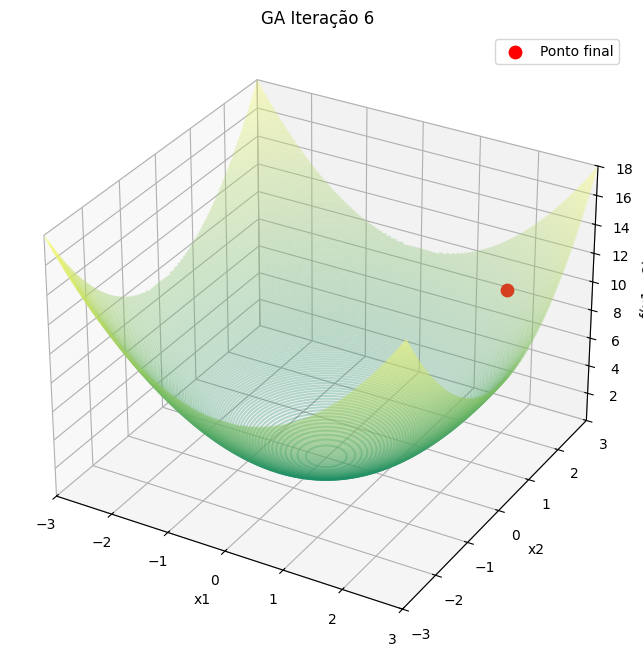

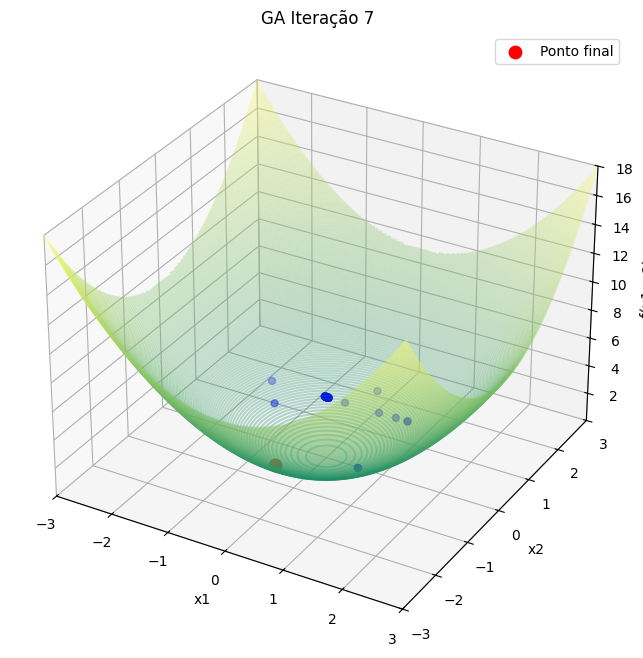

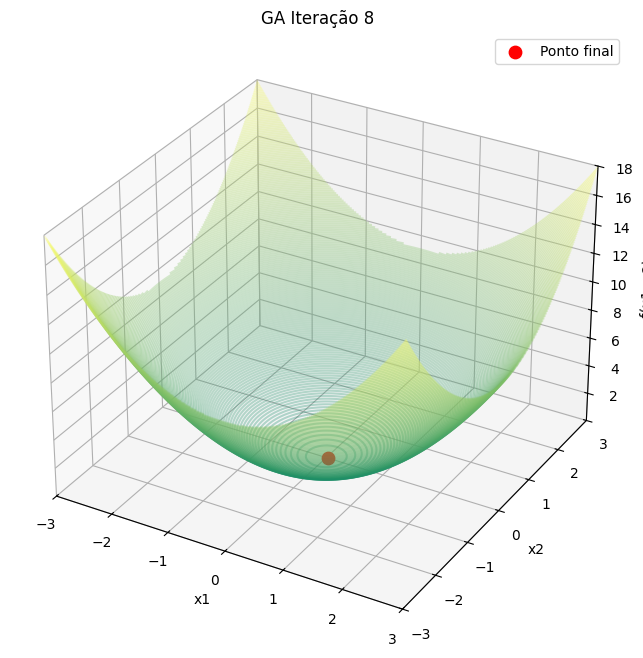

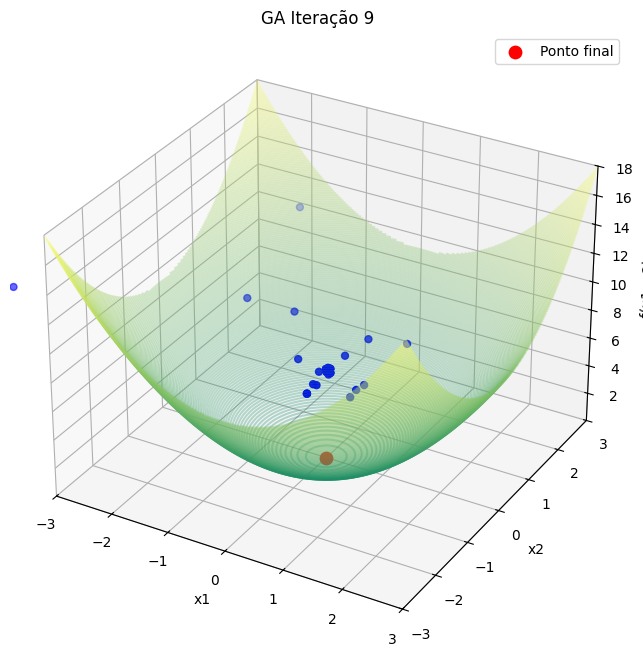

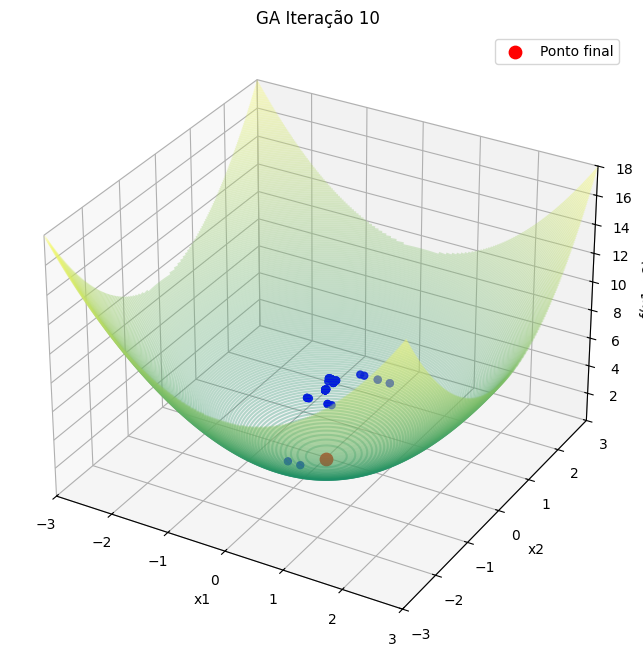

In [12]:
plot_resultados_ga(resultados_ga_esfera_20)

#### Função de Ackley

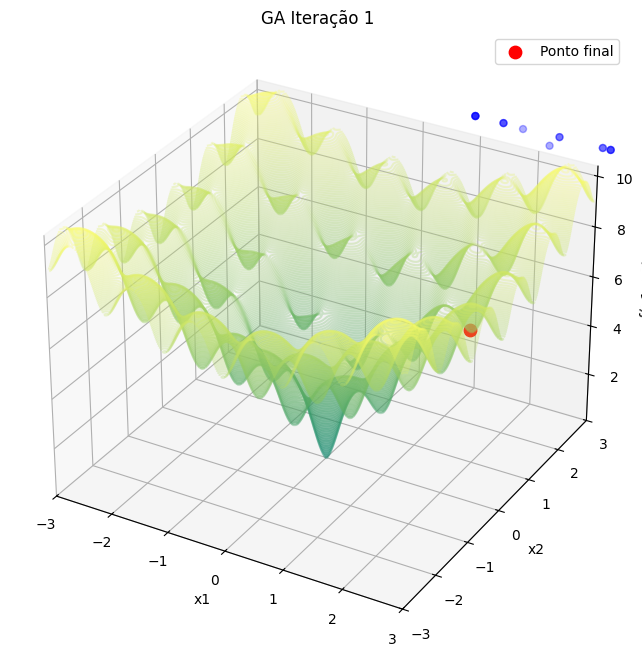

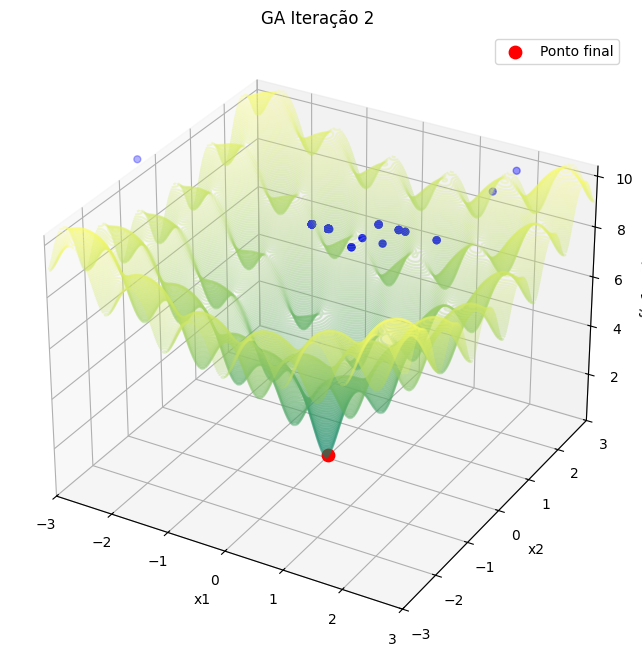

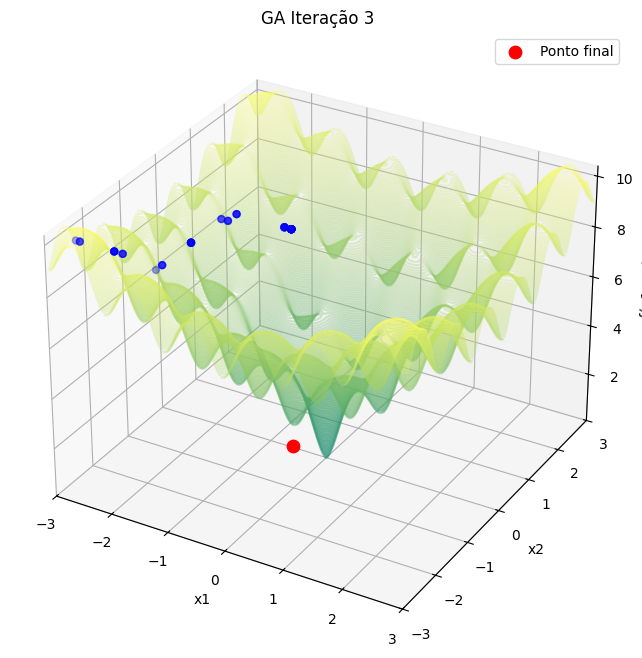

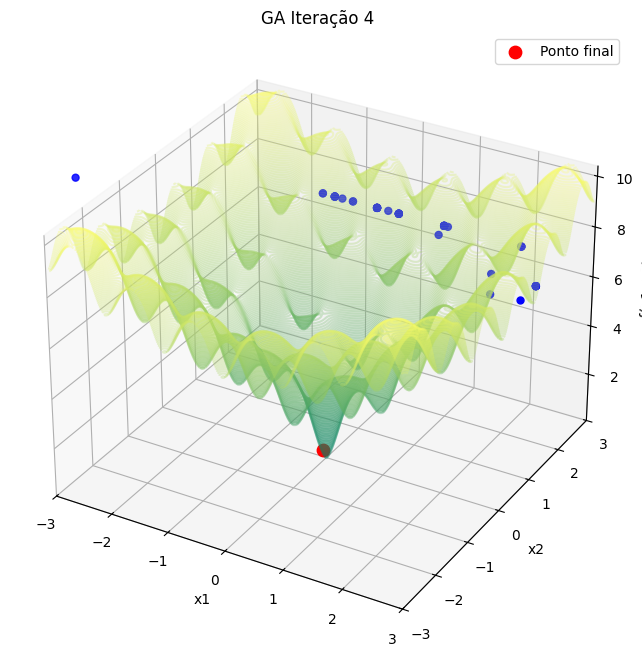

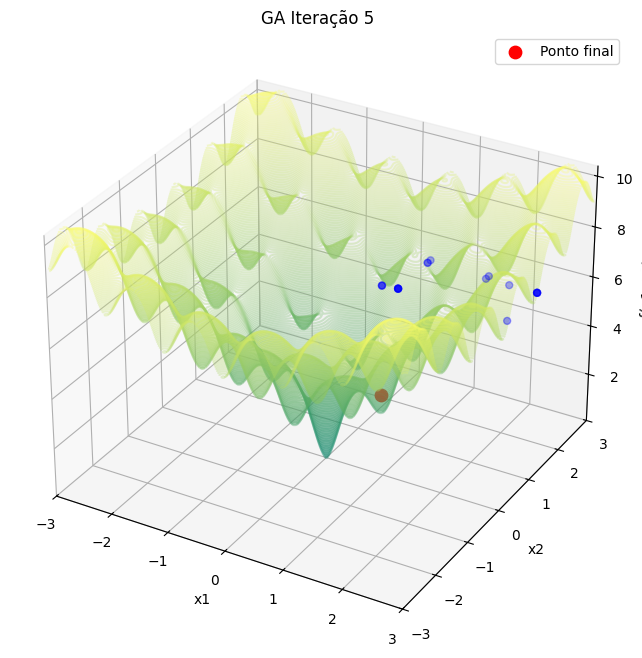

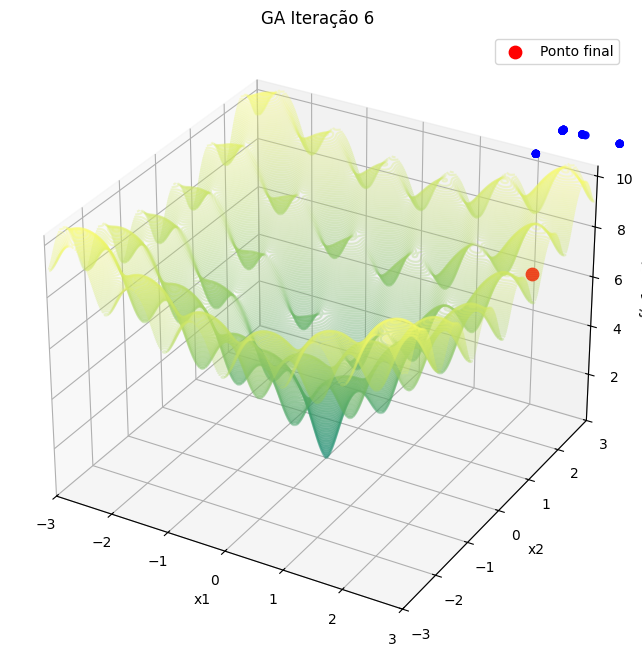

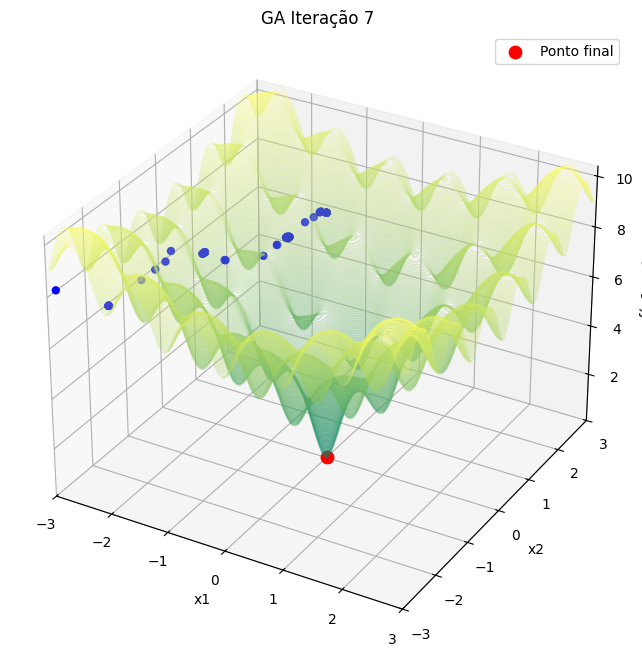

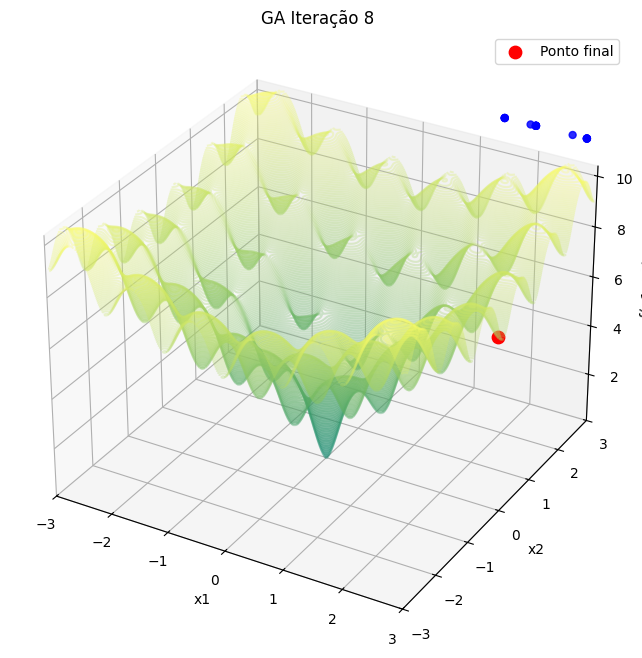

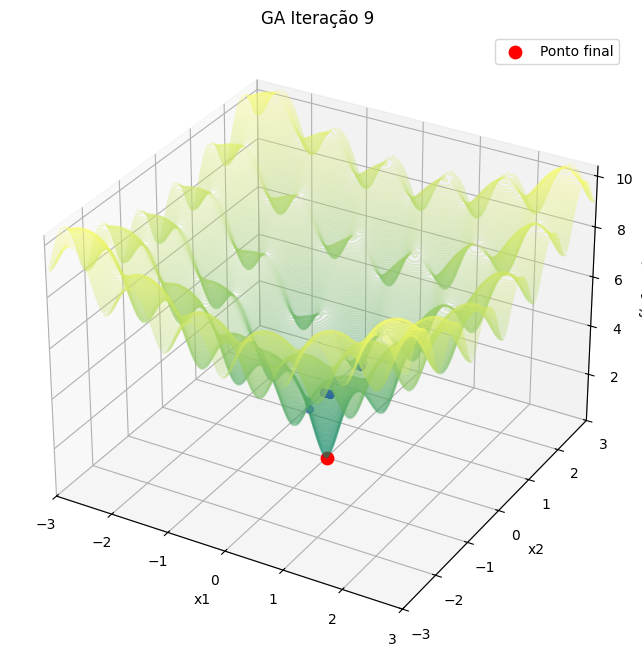

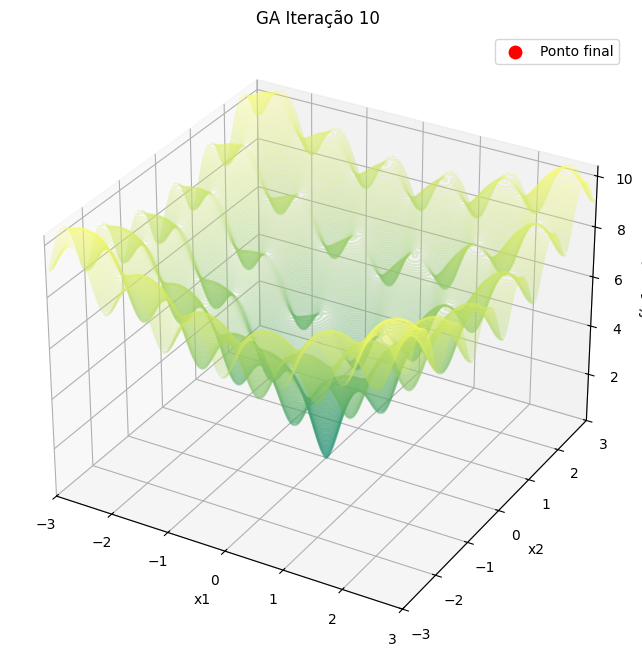

In [13]:
plot_resultados_ga(resultados_ga_ackley_20,funcao="ackley")

### b) População de 50 indivíduos.

#### Função Esfera

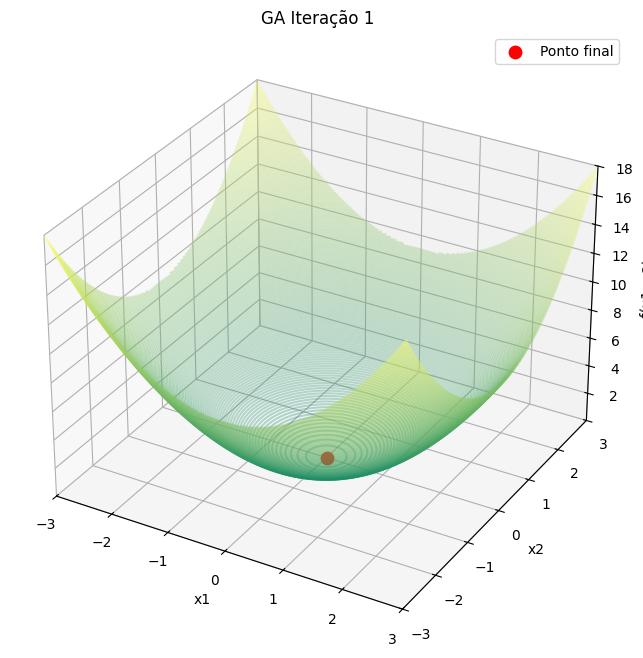

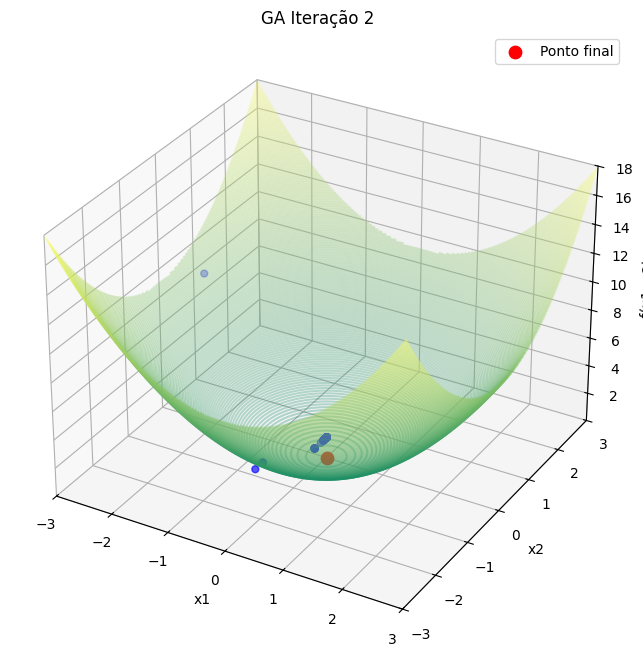

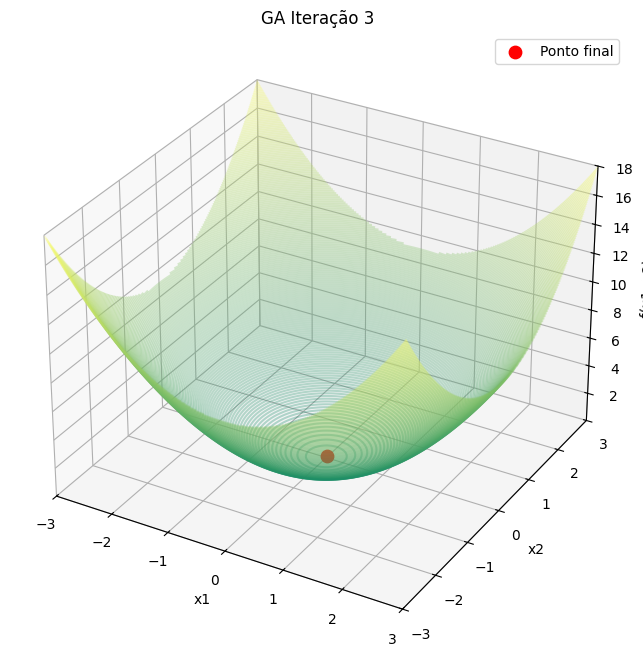

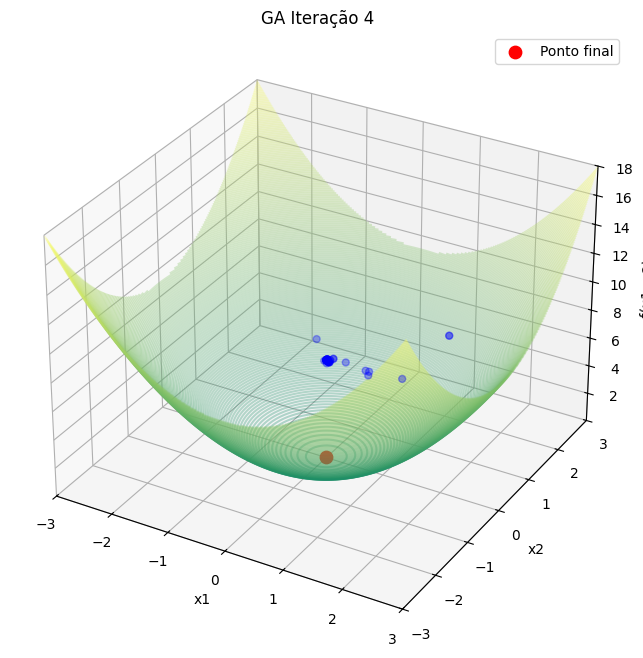

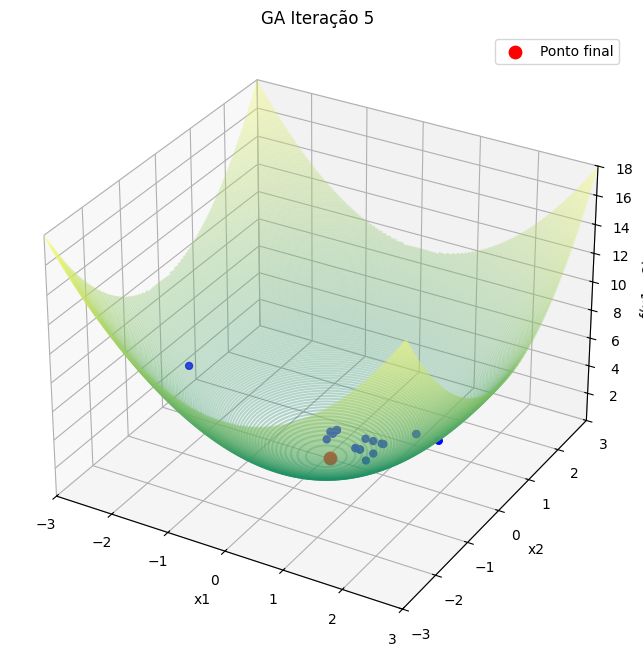

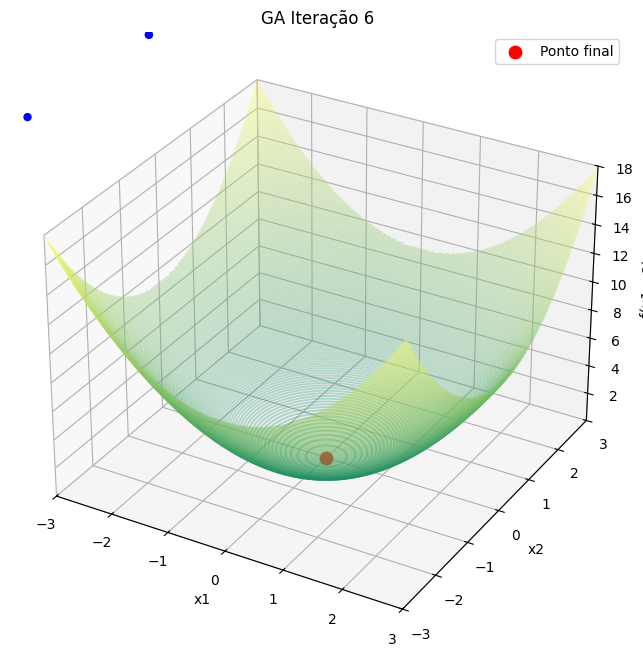

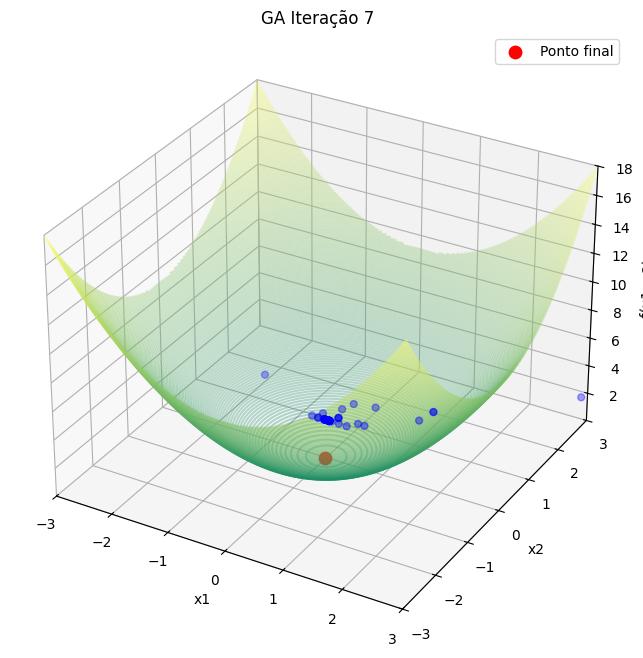

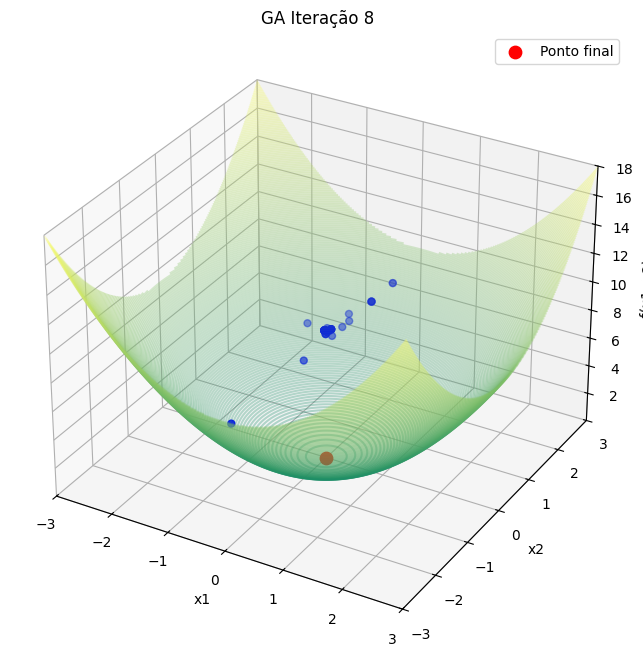

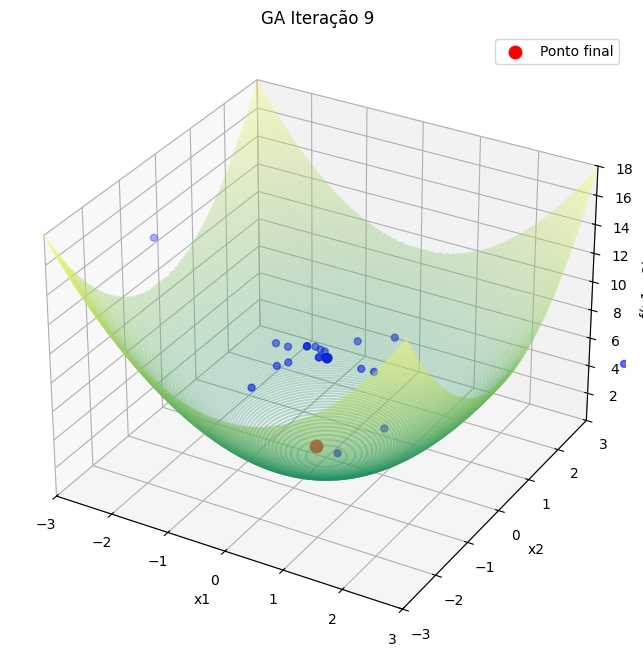

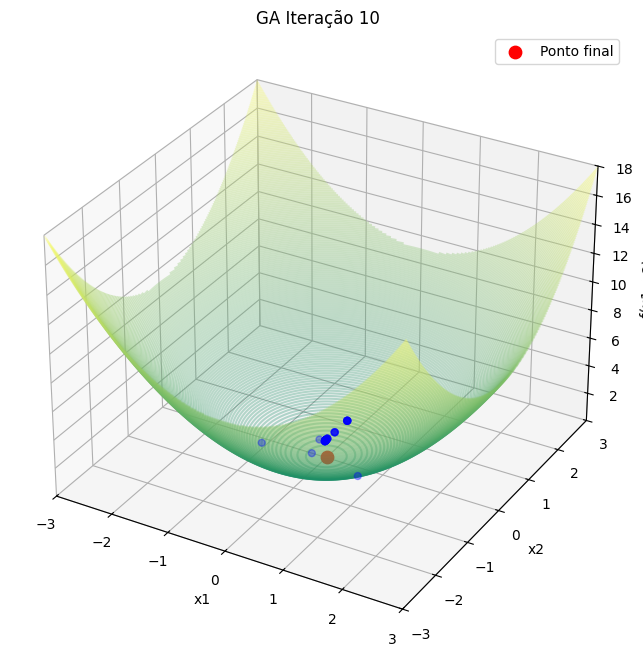

In [14]:
plot_resultados_ga(resultados_ga_esfera_50)

#### Função de Ackley

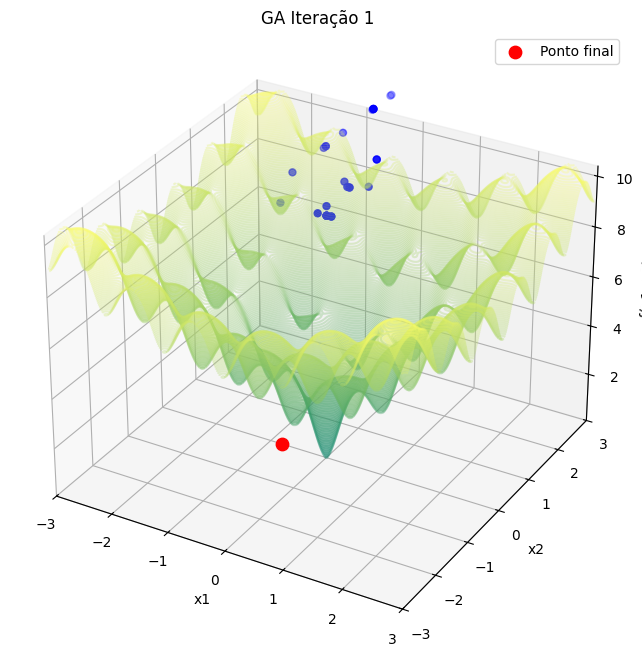

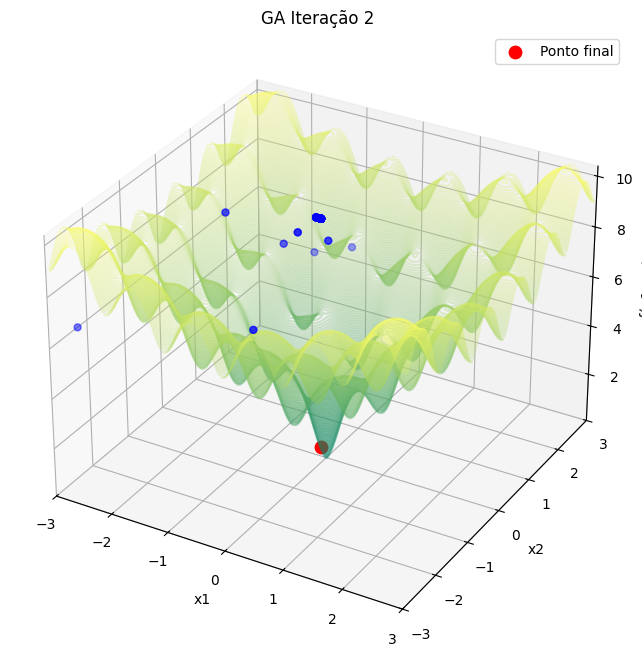

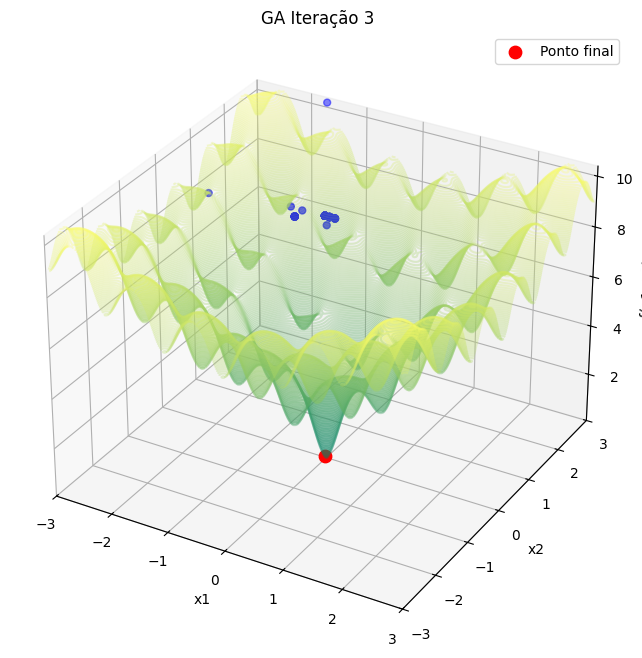

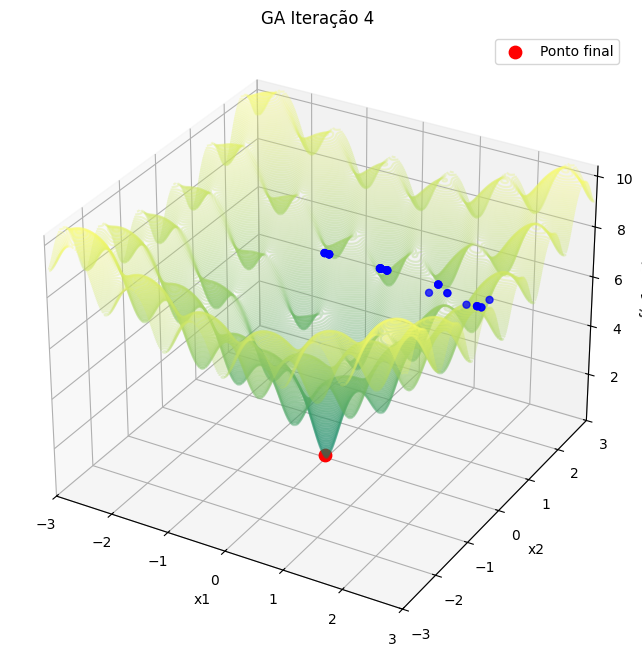

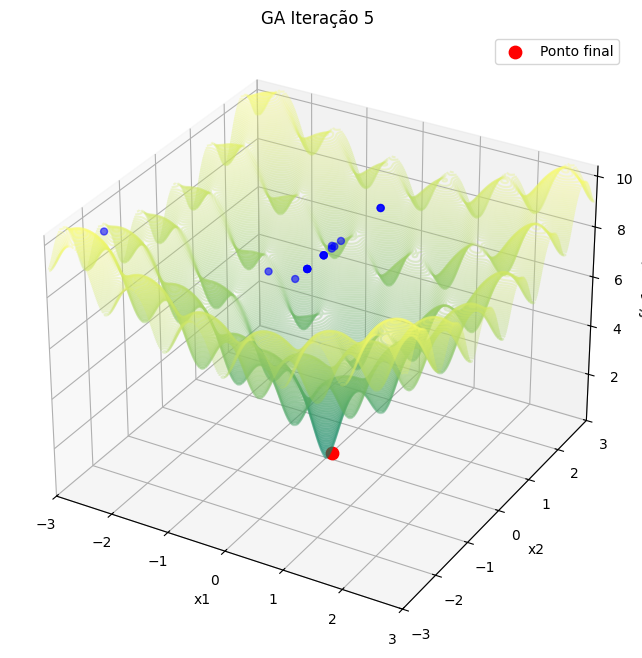

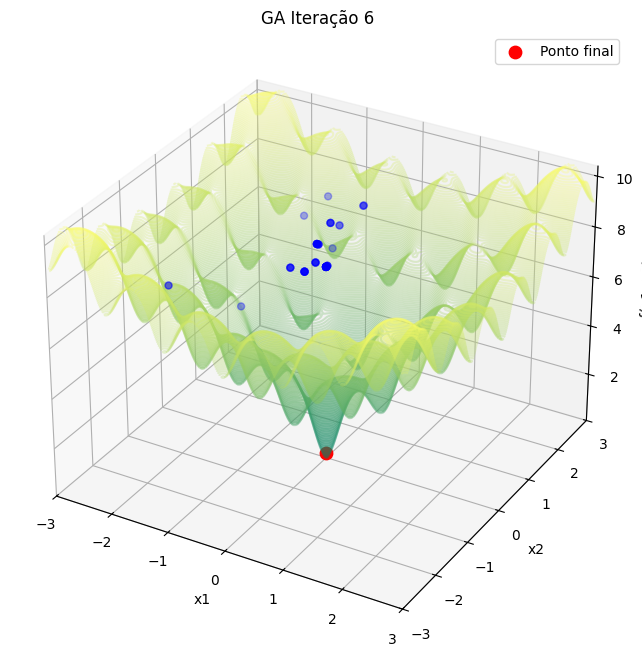

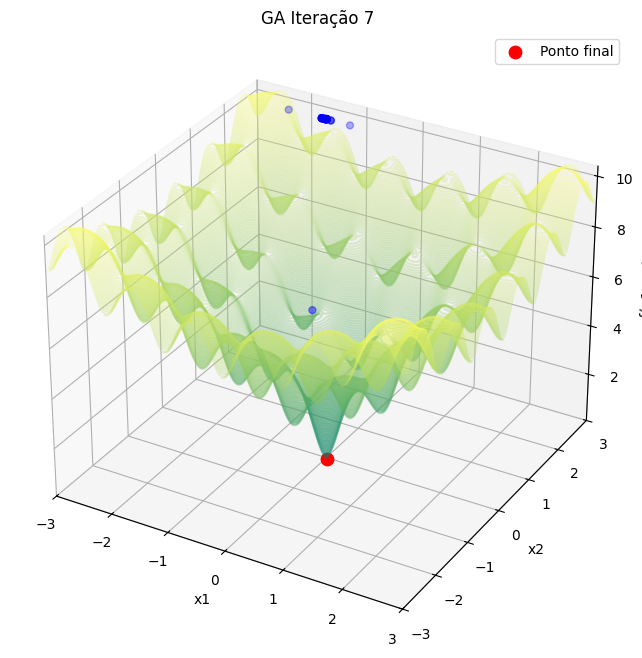

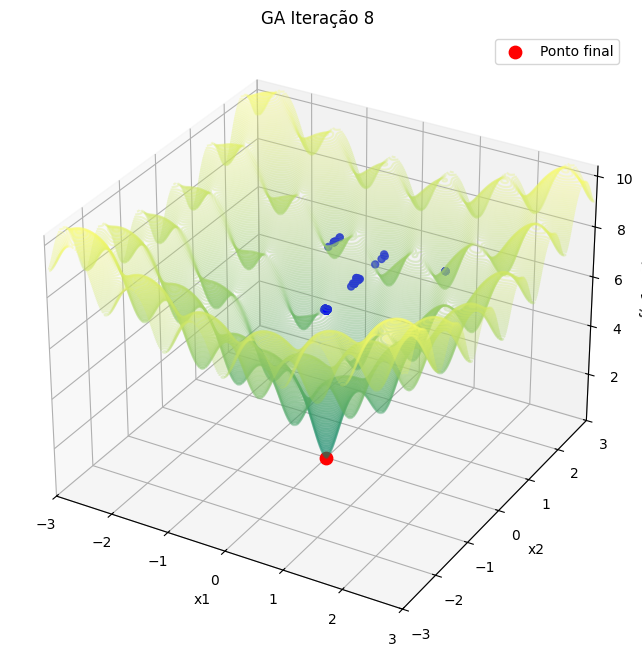

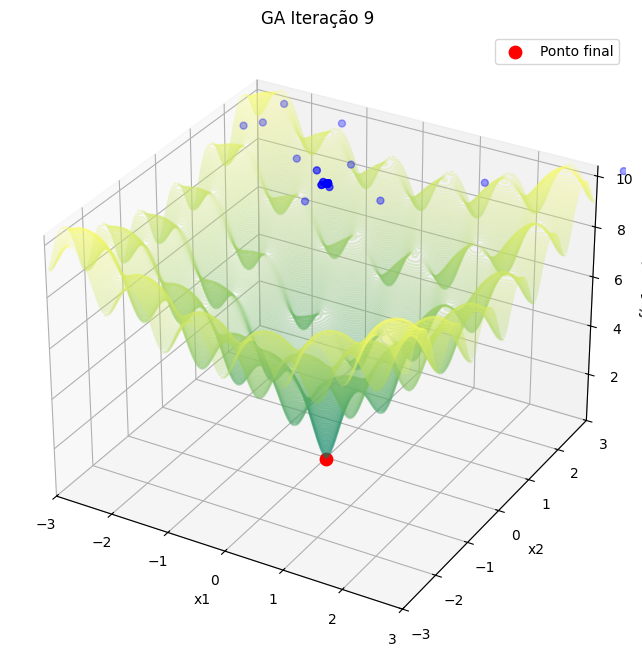

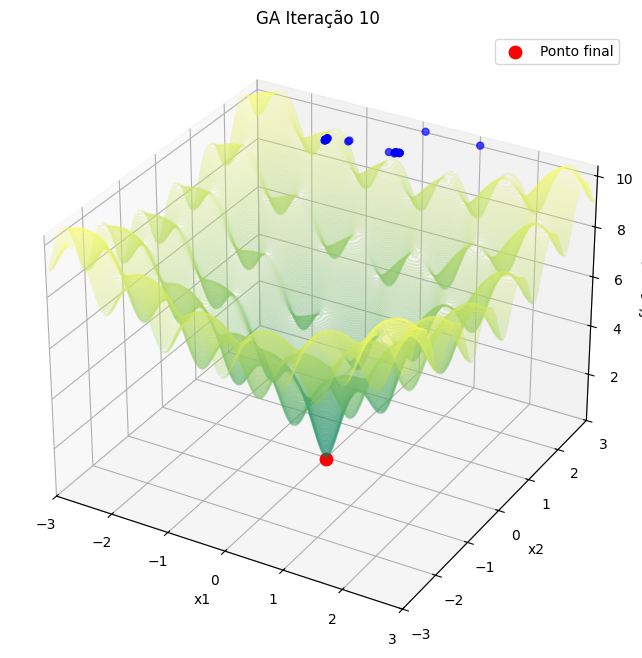

In [15]:
plot_resultados_ga(resultados_ga_ackley_50, funcao="ackley")

### Comentários.

Para uma população de 50 indivíduos, o algoritmo genético(GA) atingiu o mínimo global de ambas as funções em quase todas as iterações, exceto na primeira iteração da função de Ackley.

Para uma população de 20 indivíduos, o GA não atingiu o mínimo global da função esfera nas iterações 6 e 7. Já para a função de Ackley, o GA atingiu um mínimo local nas iterações 1, 3, 5, 6 e 8, divergiu na iteração 10 e atingiu o mínimo global nas outras iterações.

Para uma população de 5 indivíduos, o algoritmo genético implementado apresentou erro e não pôde ser executado.

Com as observações realizadas, percebe-se que o desempenho do GA é depentende do número de indivíduos utilizado no algoritmo. Essa dependência é mais significativa em comparação ao PSO.

Em termos de desempenho, a execução das iterações do GA para populações de 50 inidivíduos levou 3,01 segundos. O tempo medido leva em conta tanto a função esfera quanto a função de Ackley.

